# 식당 방문자 예측하기
- 식당 정보, 예약명단 등의 데이터를 통해 방문자 예측하기

## 프로젝트 개요
- 레스토랑 운영에는 효율적인 인력 관리, 신선한 재료 구매 및 보관 등 다양한 요소가 고려되어야 함. 특히, 손님이 레스토랑을 방문하는 시기 및 주기를 파악한다면 식재료 소비량 및 직원 스케줄 관리 등을 진행하는 데에 많은 도움을 받을 수 있음
- 최근, 이러한 수요에 부한하는 서비스인 '테이블메니저'에서는 매장 예약 및 고객 데이터를 AI로 분석해 예측 모델 만들어 다음 주의 판매 수요를 예측하고 이를 각 점주들에게 전달해 식자재 등 원가를 절감할 수 있도록 돕고 있음
- 또한, 공석으로 예측되는 테이블을 제휴 채널을 통해 판매하는 '빈자리 예측'은 이미 업장에 적용되어 높은 적중률 보이며 매출 올리는 성과 보이고 있음. 이러한 기술 통해 외식산업 소상공인들의 영업이익을 높이고 폐업률을 낯추는데 기여하고 있음

## 프로젝트 목적
- 일본 특정 지역에서 선정한 레스토랑의 2016년 1월 ~ 2017년 4월의 방문 기록, 예약 기록 등을 토대로 미래의 레스토랑 이용자 수를 예측하는 회귀 문제
- Train Data에서는 2016/1/1부터 2017/4/22까지의 기간에 대한 데이터를 포함하고 있고, 이를 토대로 Test Data에서는 2017/4/23부터 2017/5/31까지의 레스토랑별 방문자 수를 예측
- 미래에 해당하는 주에는 ‘Golden Week’라는 일본의 공휴일 주가 겹쳐져 있음
    - 골든위크(ゴールデンウィーク)는 일본에서 4월 말부터 5월 초까지 공휴일이 모여 있는 일주일(녹색의 날, 쇼와의 날, 헌법기념일, 국민의 휴일, 어린이날, 노동절)
- 공휴일 주간에 식당이 휴업해 방문자가 없는 경우에는 scoring에서 배제
- training data에서도 식당이 휴업한 경우, 제외하였음

## 데이터셋 소개
- 'Recruit Holdings'는 자동화 된 미래 고객 예측을 가능하게 할 수 있는 주요 데이터 세트에 고유한 액세스 권한 가지고 있음
- 특히, Recruit Holdings는 Hot Pepper Gourmet(레스토랑 리뷰 서비스 - 사용자가 레스토랑을 검색하고 온라인으로 예약할 수도 있음), AirREGI(레스토랑 POS 서비스 - 예약 제어 및 온라인 결제 시스템) 등을 소유하고 있음
- 예약 및 방문 데이터를 사용하여 향후 날짜에 대한 레스토랑의 총 방문자 수 예측해야 됨
- 학습 데이터 기간은 2016/1/1부터 2017/4/22까지이고 테스트 기간은 2017/4/23부터 2017/5/31
- 레스토랑 정보에서 경도와 위도의 경우, 임의로 지정되었음

<br>


### 각 데이터셋 소개
- air_reserve: air 시스템에서의 레스토랑 예약 내역
    - air_store_id : air 시스템 상 레스토랑의 ID
    - reserve_datetime: 예약을 한 시기
    - visit_datetime: 방문 예정 시기
    - reserve_visitors: 방문 예정 인원 수
- air_store: 선정된 air 레스토랑에 관한 기본 정보
    - air_store_id: air 시스템 상 레스토랑의 ID
    - air_genre_name: 레스토랑 업종
    - air_area_name: 레스토랑이 속한 도시명
    - latitude: 경도
    - longtitude: 위도
- air_visit_data: air 레스토랑에 방문했던 이들의 방문 데이터
    - air_store_id: air 시스템상 레스토랑의 ID
    - visit_date: 레스토랑을 방문한 날짜
    - visitors: 해당 일시에 레스토랑을 방문한 인원 수
- date_info: 토요일, 일요일을 포함한 일본의 공휴일 표시
    - 0: 평일
    - 1: 토요일, 일요일 포함한 공휴일
- hpg_reserve: hpg 시스템에서의 레스토랑 예약 내역
    - hpg_store_id: hpg 시스템 상 레스토랑의 ID
    - reserve_datetime: 예약을 한 시기
    - visit_datetime: 방문 예정 시기
    - reserve_visitors: 방문 예정 인원 수
- hpg_store_info: 선정된 hpg 레스토랑에 관한 정보
    - air_store_id: air 시스템 상 레스토랑의 ID
    - air_genre_name: 레스토랑 업종
    - air_area_name: 레스토랑이 속한 도시명
    - latitude: 경도
    - longtitude: 위도
- sample_submission: 테스트 데이터
    - id: air_store_id와 visit_date를 concate한 것
    - visitors: 해당 일자에 방문하기로 한 방문자의 수
- store_id_relation: air, hpg 시스템 상에서의 레스토랑의 고유 id

## 개발환경
- Python 3.7.9
- Pandas
- Numpy 1.19.5

- Scikit-Learn 0.23.0
- Matplotlib 3.3.3
- Seaborn 0.11.1

- Lightgbm 3.1.1
- XGBoost 1.3.3

# 목차
1. 데이터 확인
2. 데이터 전처리
3. EDA 및 Feature Engineering
  - 계절에 따른 방문률
  - Holiday와 아닌 날의 차이
  - 식당 장르별 예약자 및 방문객 수
  - 연속 휴일
  - air와 hpg 사이트별 방문률
  - 식당 주위 지하철 유무
  - 식당 주위 같은 장르의 식당 개수
  - 위치와 방문률의 관계
  - 식당 위치 그룹화
  - 캐글에서 가져온 피쳐
4. 데이터셋 전처리
  - Train셋과 Feature셋 합치기
  - 결측치 replace 및 label encoder
  - 데이터셋 시각화
5. 모델 학습
6. 제출
7. 참고자료
> **Feature Engineering에 중점을 두고 프로젝트 진행**

In [126]:
import os
import gc
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import glob
import numpy as np
import datetime

import lightgbm as lgb
import xgboost as xgb
from lightgbm import LGBMRegressor

import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict ,train_test_split, GridSearchCV
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVC, SVR
from sklearn.linear_model import LogisticRegression, LinearRegression, RidgeCV, SGDRegressor

np.random.seed(40)

from IPython.core import display as ICD

In [127]:
data = {'air_visit': pd.read_csv('air_visit_data.csv'),
        'air_store_info': pd.read_csv('air_store_info.csv'),
        'hpg_store_info': pd.read_csv('hpg_store_info.csv'),
        'air_reserve': pd.read_csv('air_reserve.csv'),
        'hpg_reserve': pd.read_csv('hpg_reserve.csv'),
        'store_id': pd.read_csv('store_id_relation.csv'),
        'sub': pd.read_csv('sample_submission.csv'),
        'data_info': pd.read_csv('date_info.csv').rename(columns={'calendar_date': 'visit_date'})}

# 데이터 확인

In [128]:
for name, df in data.items():
    print(name)
    ICD.display(df.head(2))

air_visit


,air_store_id,visit_date,visitors
0,air_ba937bf13d40fb24,2016-01-13,25
1,air_ba937bf13d40fb24,2016-01-14,32


air_store_info


,air_store_id,air_genre_name,air_area_name,latitude,longitude
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853


hpg_store_info


,hpg_store_id,hpg_genre_name,hpg_area_name,latitude,longitude
0,hpg_6622b62385aec8bf,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221
1,hpg_e9e068dd49c5fa00,Japanese style,Tōkyō-to Setagaya-ku Taishidō,35.643675,139.668221


air_reserve


,air_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1
1,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3


hpg_reserve


,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,hpg_c63f6f42e088e50f,2016-01-01 11:00:00,2016-01-01 09:00:00,1
1,hpg_dac72789163a3f47,2016-01-01 13:00:00,2016-01-01 06:00:00,3


store_id


,air_store_id,hpg_store_id
0,air_63b13c56b7201bd9,hpg_4bc649e72e2a239a
1,air_a24bf50c3e90d583,hpg_c34b496d0305a809


sub


,id,visitors
0,air_00a91d42b08b08d9_2017-04-23,0
1,air_00a91d42b08b08d9_2017-04-24,0


data_info


,visit_date,day_of_week,holiday_flg
0,2016-01-01,Friday,1
1,2016-01-02,Saturday,1


# Train과 Test 데이터

In [129]:
data['air_visit'].head()

,air_store_id,visit_date,visitors
0,air_ba937bf13d40fb24,2016-01-13,25
1,air_ba937bf13d40fb24,2016-01-14,32
2,air_ba937bf13d40fb24,2016-01-15,29
3,air_ba937bf13d40fb24,2016-01-16,22
4,air_ba937bf13d40fb24,2016-01-18,6


In [130]:
data['sub'].head()

,id,visitors
0,air_00a91d42b08b08d9_2017-04-23,0
1,air_00a91d42b08b08d9_2017-04-24,0
2,air_00a91d42b08b08d9_2017-04-25,0
3,air_00a91d42b08b08d9_2017-04-26,0
4,air_00a91d42b08b08d9_2017-04-27,0


In [131]:
def date_format(df, date_col, add=True):
    df[date_col] = pd.to_datetime(df[date_col])
    if add:
        df['year'] = df[date_col].dt.year
        df['month'] = df[date_col].dt.month
        df['dow'] = df[date_col].dt.dayofweek
    df[date_col] = pd.to_datetime(df[date_col].dt.date)
    return df

# 데이터 전처리

### 결측치 확인

In [132]:
data = {'air_visit': pd.read_csv('air_visit_data.csv'),
        'air_store_info': pd.read_csv('air_store_info.csv'),
        'hpg_store_info': pd.read_csv('hpg_store_info.csv'),
        'air_reserve': pd.read_csv('air_reserve.csv'),
        'hpg_reserve': pd.read_csv('hpg_reserve.csv'),
        'store_id': pd.read_csv('store_id_relation.csv'),
        'sub': pd.read_csv('sample_submission.csv'),
        'data_info': pd.read_csv('date_info.csv').rename(columns={'calendar_date': 'visit_date'})}

Nullity of Data


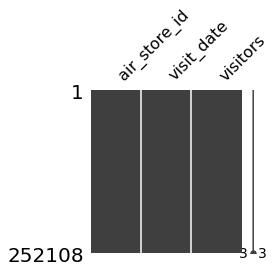

In [133]:
print("Nullity of Data")
msno.matrix(data['air_visit'] ,figsize=(3,3))  
plt.show()

Nullity of Data


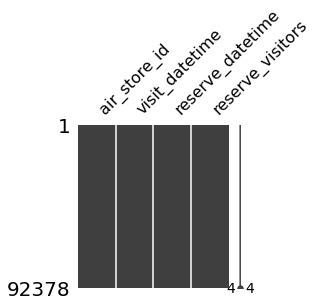

In [134]:
print("Nullity of Data")
msno.matrix(data['air_reserve'] ,figsize=(3,3))  
plt.show()

Nullity of Data


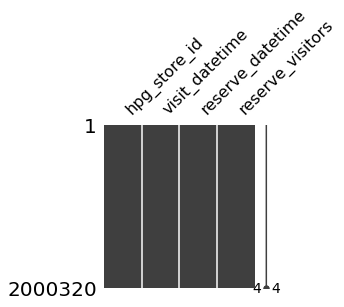

In [135]:
print("Nullity of Data")
msno.matrix(data['hpg_reserve'] ,figsize=(3,3))  
plt.show()

In [136]:
sorted(data['air_visit'].air_store_id.unique()) == sorted(data['air_store_info'].air_store_id)

True

> **처리해줘야하는 결측치값이 없다고 판단**

### Train과 Test 데이터 전처리

In [137]:
# # Train
data['air_visit'] = date_format(data['air_visit'], 'visit_date')
print(data['air_visit'].shape)
data['air_visit'].head()

(252108, 6)


,air_store_id,visit_date,visitors,year,month,dow
0,air_ba937bf13d40fb24,2016-01-13,25,2016,1,2
1,air_ba937bf13d40fb24,2016-01-14,32,2016,1,3
2,air_ba937bf13d40fb24,2016-01-15,29,2016,1,4
3,air_ba937bf13d40fb24,2016-01-16,22,2016,1,5
4,air_ba937bf13d40fb24,2016-01-18,6,2016,1,0


In [138]:
# test
data['sub']['visit_date'] = data['sub']['id'].apply(lambda x: str(x).split('_')[2])
data['sub']['air_store_id'] = data['sub']['id'].apply(lambda x: '_'.join(x.split('_')[:2]))
data['sub'] = date_format(data['sub'], 'visit_date')
print(data['sub'].shape)
data['sub'].head()

(32019, 7)


,id,visitors,visit_date,air_store_id,year,month,dow
0,air_00a91d42b08b08d9_2017-04-23,0,2017-04-23,air_00a91d42b08b08d9,2017,4,6
1,air_00a91d42b08b08d9_2017-04-24,0,2017-04-24,air_00a91d42b08b08d9,2017,4,0
2,air_00a91d42b08b08d9_2017-04-25,0,2017-04-25,air_00a91d42b08b08d9,2017,4,1
3,air_00a91d42b08b08d9_2017-04-26,0,2017-04-26,air_00a91d42b08b08d9,2017,4,2
4,air_00a91d42b08b08d9_2017-04-27,0,2017-04-27,air_00a91d42b08b08d9,2017,4,3


### 보조 데이터 전처리
- air_reserve
- hpg_reserve
  - inner로 합쳐 준 이유는 예측 데이터에 air 매장밖에 없음
- store info 
  - 각 가게의 정보 데이터를 이용해 각 매장의 장르 merge

In [139]:
data['data_info'] = date_format(data['data_info'], 'visit_date', add=False)
print(data['data_info'].shape)
data['data_info'].head()

(517, 3)


,visit_date,day_of_week,holiday_flg
0,2016-01-01,Friday,1
1,2016-01-02,Saturday,1
2,2016-01-03,Sunday,1
3,2016-01-04,Monday,0
4,2016-01-05,Tuesday,0


### hpg reserve

In [140]:
print(data['hpg_reserve'].shape)
data['hpg_reserve'].head() 

(2000320, 4)


,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,hpg_c63f6f42e088e50f,2016-01-01 11:00:00,2016-01-01 09:00:00,1
1,hpg_dac72789163a3f47,2016-01-01 13:00:00,2016-01-01 06:00:00,3
2,hpg_c8e24dcf51ca1eb5,2016-01-01 16:00:00,2016-01-01 14:00:00,2
3,hpg_24bb207e5fd49d4a,2016-01-01 17:00:00,2016-01-01 11:00:00,5
4,hpg_25291c542ebb3bc2,2016-01-01 17:00:00,2016-01-01 03:00:00,13


### air와 hpg 관계 정립
- datetime 변환
- air와 hpg 두 곳 동시에 있는 데이터 합치기
- reserve_datetime을 제거하기 위해 해당 데이터로부터 정보 추출(diff)

In [141]:
data['hpg_reserve'] = pd.merge(data['hpg_reserve'], data['store_id'], how='inner', on=['hpg_store_id'])
data['hpg_reserve'] = date_format(data['hpg_reserve'], 'visit_datetime', add=False)
data['hpg_reserve'] = date_format(data['hpg_reserve'], 'reserve_datetime', add=False)

new_columns = ['hpg_store_id', 'air_store_id', 'visit_datetime', 'reserve_datetime', 'reserve_visitors']
data['hpg_reserve'] = data['hpg_reserve'].reindex(new_columns, axis=1)
data['hpg_reserve'] = data['hpg_reserve'].rename(columns={'visit_datetime': 'visit_date'})
data['hpg_reserve']['reserve_datetime_diff'] = (data['hpg_reserve'].visit_date - data['hpg_reserve'].reserve_datetime).dt.days
data['hpg_reserve'].head()

,hpg_store_id,air_store_id,visit_date,reserve_datetime,reserve_visitors,reserve_datetime_diff
0,hpg_878cc70b1abc76f7,air_db80363d35f10926,2016-01-01,2016-01-01,4,0
1,hpg_878cc70b1abc76f7,air_db80363d35f10926,2016-01-02,2016-01-02,2,0
2,hpg_878cc70b1abc76f7,air_db80363d35f10926,2016-01-03,2016-01-02,6,1
3,hpg_878cc70b1abc76f7,air_db80363d35f10926,2016-01-06,2016-01-04,3,2
4,hpg_878cc70b1abc76f7,air_db80363d35f10926,2016-01-11,2016-01-11,2,0


### air reserve
- datatime 변환
- reserve_datetime을 제거하기 위해 해당 데이터로부터 정보 추출(diff)

In [142]:
print(data['air_reserve'].shape)
data['air_reserve'].head()

(92378, 4)


,air_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1
1,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3
2,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,6
3,air_877f79706adbfb06,2016-01-01 20:00:00,2016-01-01 16:00:00,2
4,air_db80363d35f10926,2016-01-01 20:00:00,2016-01-01 01:00:00,5


In [143]:
data['air_reserve'] = date_format(data['air_reserve'], 'visit_datetime', add=False)
data['air_reserve'] = date_format(data['air_reserve'], 'reserve_datetime', add=False)

new_columns = ['air_store_id', 'visit_datetime', 'reserve_datetime', 'reserve_visitors']
data['air_reserve'] = data['air_reserve'].reindex(new_columns, axis=1)
data['air_reserve'] = data['air_reserve'].rename(columns={'visit_datetime': 'visit_date'})
data['air_reserve']['reserve_datetime_diff'] = (data['air_reserve'].visit_date - data['air_reserve'].reserve_datetime).dt.days
data['air_reserve'].head()

,air_store_id,visit_date,reserve_datetime,reserve_visitors,reserve_datetime_diff
0,air_877f79706adbfb06,2016-01-01,2016-01-01,1,0
1,air_db4b38ebe7a7ceff,2016-01-01,2016-01-01,3,0
2,air_db4b38ebe7a7ceff,2016-01-01,2016-01-01,6,0
3,air_877f79706adbfb06,2016-01-01,2016-01-01,2,0
4,air_db80363d35f10926,2016-01-01,2016-01-01,5,0


### Merge air&hpg
- air_reserve와 hpg_reserve에 있는 정보 합치기
- 정보 : reserve_visitors, reserve_datetime_dff

In [144]:
data['air_reserve'] = \
data['air_reserve'].groupby(['air_store_id', 'visit_date'], as_index=False)[['reserve_visitors', 'reserve_datetime_diff']].sum()
data['hpg_reserve'] = \
data['hpg_reserve'].groupby(['air_store_id', 'visit_date'], as_index=False)[['reserve_visitors', 'reserve_datetime_diff']].sum()

In [145]:
merge = pd.concat([data['air_reserve'], data['hpg_reserve']])
merge = merge.groupby(['air_store_id', 'visit_date'], as_index=False).sum()
merge.head()

,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff
0,air_00a91d42b08b08d9,2016-01-14,2,3
1,air_00a91d42b08b08d9,2016-01-15,4,6
2,air_00a91d42b08b08d9,2016-01-16,2,3
3,air_00a91d42b08b08d9,2016-01-22,2,3
4,air_00a91d42b08b08d9,2016-01-29,5,6


### Feature 가방 만들기

In [146]:
from itertools import product
unique_stores = data['sub']['air_store_id'].unique()
date_list = pd.date_range(start='1/1/2016', end='31/05/2017')

feature_dummy = pd.DataFrame(list(product(unique_stores, date_list)), columns = ['air_store_id', 'visit_date'])
data['feature'] = feature_dummy
print(data['feature'].shape)
data['feature'].head()

(424457, 2)


,air_store_id,visit_date
0,air_00a91d42b08b08d9,2016-01-01
1,air_00a91d42b08b08d9,2016-01-02
2,air_00a91d42b08b08d9,2016-01-03
3,air_00a91d42b08b08d9,2016-01-04
4,air_00a91d42b08b08d9,2016-01-05


In [147]:
data['feature'] = pd.merge(data['feature'], merge, on=['air_store_id', 'visit_date'], how='left')
print(data['feature'].shape)
data['feature'].head()

(424457, 4)


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN
3,air_00a91d42b08b08d9,2016-01-04,NaN,NaN
4,air_00a91d42b08b08d9,2016-01-05,NaN,NaN


# EDA

### 계절에 따른 방문률
- 계절에 따라 방문자의 수가 변화하는 것을 식별
- 각 날짜마다 season값을 부여해서 feature로 사용

(424457, 4)


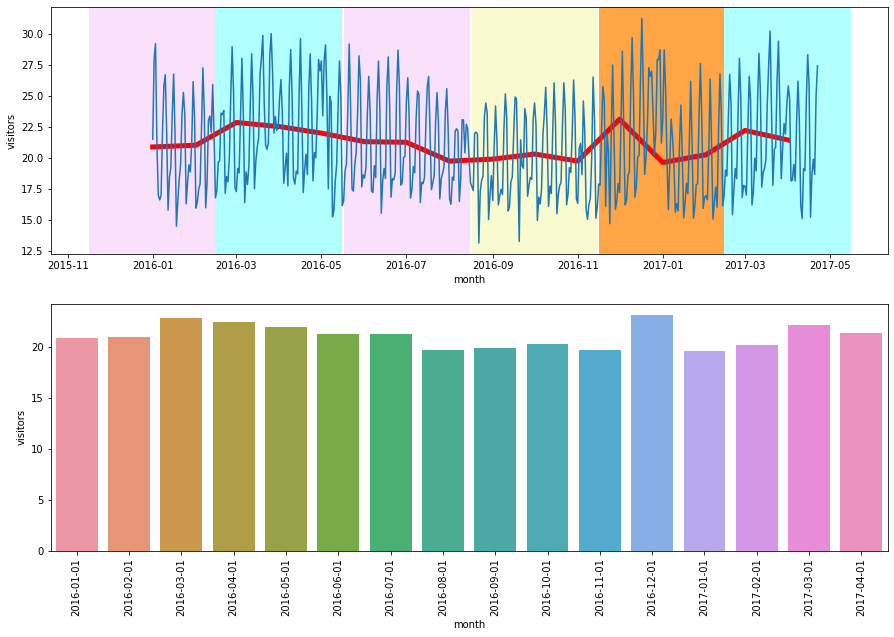

In [148]:
df_show = data['air_visit'].copy()

use_col = ['visit_date', 'visitors']
df_show1 = df_show[use_col].groupby(['visit_date']).mean().reset_index()

df_show['month'] =  pd.to_datetime(df_show['visit_date']).dt.to_period('M')
df_show2 = df_show.groupby('month').mean().reset_index()
df_show2['month'] = df_show2['month'].dt.to_timestamp()
df_show2

fig, ax = plt.subplots(2,1, figsize=(15,10))

sns.lineplot(x='month', y='visitors', data=df_show2, color='r', linewidth=5, ax=ax[0])
sns.barplot(x='month', y='visitors', data=df_show2, ax=ax[1])
sns.lineplot(x='visit_date', y='visitors', data=df_show1, ax=ax[0])
ax[1].set_xticklabels([t.get_text().split("T")[0] for t in ax[1].get_xticklabels()])
plt.xticks(rotation=90)

color = ['#B2FFFF', '#F9E0FB', '#F9FAD0', '#FFA546', '#B2FFFF', '#F9E0FB']
for i in range(-1,5):
    ax[0].axvspan(df_show2['month'].iloc[(i+1)*3] - pd.DateOffset(months=1, days=15), 
               df_show2['month'].iloc[(i+1)*3] + pd.DateOffset(months=1, day=15), color=color[i])
print(data['feature'].shape)    
plt.show()

In [149]:
def get_season(c):
    month = c['visit_date'].month  
    if month in [3,4,5]:
        return 0
    elif month in [6,7,8]:
        return 1
    elif month in [9,10,11]:
        return 2
    elif month in [12,1,2]:
        return 3
data['feature']['season'] = data['feature'].apply(get_season, axis=1)
print(data['feature'].shape)  
data['feature'].head()

(424457, 5)


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3
3,air_00a91d42b08b08d9,2016-01-04,NaN,NaN,3
4,air_00a91d42b08b08d9,2016-01-05,NaN,NaN,3


### Holiday와 아닌 날의 차이
- holiday와 holiday가 아닌 날의 방문자의 수 차이 식별
- data_info 데이터를 이용해 각 날짜별로 holiday 설정

<Figure size 1080x360 with 0 Axes>

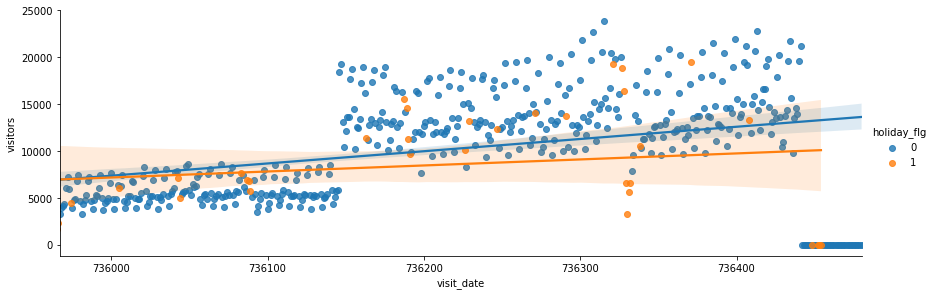

(424457, 6)


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season,holiday_flg
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3,1
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3,1
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3,1
3,air_00a91d42b08b08d9,2016-01-04,NaN,NaN,3,0
4,air_00a91d42b08b08d9,2016-01-05,NaN,NaN,3,0


In [150]:
import datetime as dt

df_show = pd.merge(data['feature'], data['air_visit'][['air_store_id', 'visit_date', 'visitors']], 
                   on=['air_store_id', 'visit_date'], how='left')
df_show = df_show[['visit_date', 'visitors']].groupby('visit_date').sum().reset_index()
df_show = pd.merge(df_show, data['data_info'][['visit_date', 'holiday_flg']], on='visit_date', how='left')

df_show['visit_date'] = pd.to_datetime(df_show['visit_date'])
df_show['visit_date'] = df_show['visit_date'].map(datetime.datetime.toordinal)

plt.figure(figsize=(15,5))
sns.lmplot(x='visit_date', y='visitors', hue='holiday_flg', data=df_show,height=4, aspect=3)
plt.show()

data['feature'] = pd.merge(data['feature'], data['data_info'][['visit_date', 'holiday_flg']], on='visit_date', how='left')
print(data['feature'].shape)  
data['feature'].head()

### 식당 장르별 예약자 및 방문객 수
- 각 식당별로 방문자 수의 평균값이 다르게 나타나는 것을 식별
- 각 식당id를 이용해 식당 장르를 매칭

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
air_genre_name,Asian,Bar/Cocktail,Cafe/Sweets,Creative cuisine,Dining bar,International cuisine,Italian/French,Izakaya,Japanese food,Karaoke/Party,Okonomiyaki/Monja/Teppanyaki,Other,Western food,Yakiniku/Korean food
visitors,38.747664,13.308733,22.60636,23.600052,18.723532,25.209677,22.582953,23.08285,19.55144,29.992248,22.611171,19.861872,22.276087,21.235872


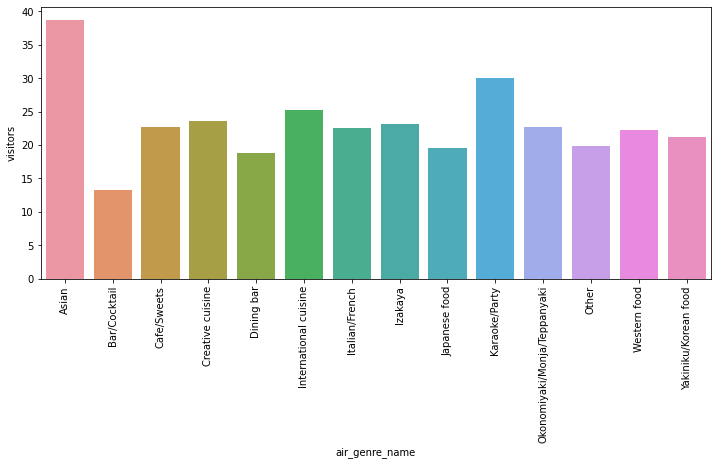

(424457, 8)


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami
3,air_00a91d42b08b08d9,2016-01-04,NaN,NaN,3,0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami
4,air_00a91d42b08b08d9,2016-01-05,NaN,NaN,3,0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami


In [151]:
df_show = pd.merge(data['air_visit'], data['air_store_info'], on='air_store_id', how='left')
df_show = df_show[['visitors', 'air_genre_name']].groupby('air_genre_name').mean().reset_index()
ICD.display(df_show.T.head())

plt.figure(figsize=(12,5))
sns.barplot(x='air_genre_name', y='visitors', data=df_show)
plt.xticks(rotation=90)
plt.show()

data['feature'] = pd.merge(data['feature'], data['air_store_info'], on='air_store_id', how='left')
data['feature'] = data['feature'].drop(['latitude', 'longitude'], axis=1)
print(data['feature'].shape)  
ICD.display(data['feature'].head())

### 연속 휴일
- 3일 연속 휴일의 경우 방문률 차이
- 금토일, 토일월
- holiday_flg가 금or월 인 경우

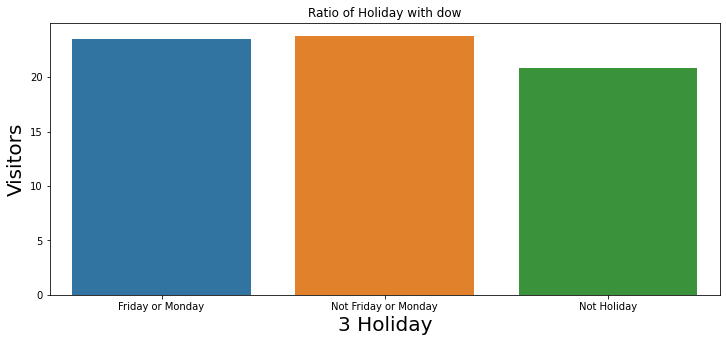

(424457, 9)


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,0
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1


In [152]:
df_show = data['feature'].copy()
df_show['dow'] = df_show['visit_date'].dt.dayofweek

def get_holiday(c):
    if ((c['dow'] == 4) | (c['dow'] == 0)) & (c['holiday_flg'] == 1):
        return 0
    elif ((c['dow'] != 4) & (c['dow'] != 0)) & (c['holiday_flg'] == 1):
        return 1
    else:
        return 2
df_show['3-holiday'] = df_show.apply(get_holiday, axis=1)

col_use = ['air_store_id', 'visit_date', '3-holiday']
data['feature'] = pd.merge(data['feature'], df_show[col_use], on=['air_store_id', 'visit_date'], how='left')


df_show = pd.merge(data['air_visit'], df_show, on=['air_store_id', 'visit_date'])
df_show = df_show[['3-holiday', 'visitors']].groupby('3-holiday').mean().reset_index()
df_show['3-holiday'] = df_show['3-holiday'].map({0:'Friday or Monday', 1:'Not Friday or Monday', 2:'Not Holiday'})

plt.figure(figsize=(12,5))
sns.barplot(x='3-holiday', y='visitors', data=df_show) 
plt.xlabel('3 Holiday', fontsize=20)
plt.ylabel('Visitors', fontsize=20)
plt.title('Ratio of Holiday with dow')
plt.show()

print(data['feature'].shape)  
ICD.display(data['feature'].head(3))

### air와 hpg 사이트별 방문률
- air에서만 있는 store
- air와 hpg 두 곳 모두 있는 store

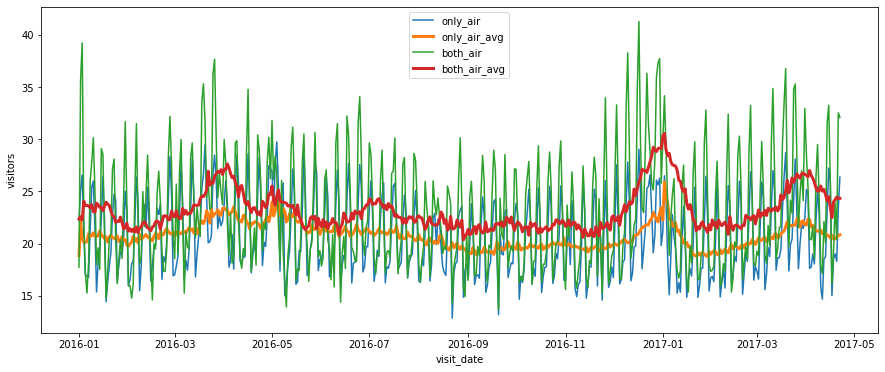

In [153]:
both_air = data['store_id']['air_store_id']
only_air = list(set(data['air_store_info']['air_store_id']) - set(both_air))

only_air_data = data['air_visit'][data['air_visit']['air_store_id'].isin(only_air)]
both_air_data = data['air_visit'][data['air_visit']['air_store_id'].isin(both_air)]

use_col = ['visit_date', 'visitors']
df_show1 = only_air_data[use_col]
df_show2 = both_air_data[use_col]

df_show1['rolling'] = df_show1.visitors.rolling(20).mean().shift(-3)
df_show2['rolling'] = df_show2.visitors.rolling(20).mean().shift(-3)

df_show1 = df_show1.groupby('visit_date').mean().reset_index()
df_show2 = df_show2.groupby('visit_date').mean().reset_index()

plt.figure(figsize=(15,6))
sns.lineplot(x='visit_date', y='visitors', data=df_show1)
sns.lineplot(x='visit_date', y='rolling', data=df_show1, linewidth=3)
sns.lineplot(x='visit_date', y='visitors', data=df_show2)
sns.lineplot(x='visit_date', y='rolling', data=df_show2, linewidth=3)

plt.legend(['only_air', 'only_air_avg', 'both_air', 'both_air_avg'])
plt.show()

In [154]:
data['air_store_info']['is_both'] = list(map(int, data['air_store_info']['air_store_id'].isin(both_air)))

use_col = ['air_store_id', 'is_both']
data['feature'] = pd.merge(data['feature'], data['air_store_info'][use_col], on='air_store_id', how='left')

print(data['feature'].shape)
data['feature'].head(3)

(424457, 10)


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,is_both
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,0,1
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1


### 식당 주위 지하철 유무
- 직선 거리
> **실제 쥬피터노트북 실행 시 보이는 시각화(Folium)**

In [155]:
import geopandas as gpd

stations = pd.read_csv('air_station_distances.csv')
stations = stations[['station_id', 'station_latitude', 'station_longitude']]
gpd_stations = gpd.GeoDataFrame(stations, 
                                geometry=gpd.points_from_xy(stations.station_longitude, stations.station_latitude),
                                crs="EPSG:4326")
data['air_store_info'] = gpd.GeoDataFrame(data['air_store_info'],
                                          crs="EPSG:4326",
                                          geometry=gpd.points_from_xy(data['air_store_info'].longitude, 
                                                                      data['air_store_info'].latitude))

In [156]:
import folium
station_buffer2000 = gpd_stations.to_crs(epsg=7855).buffer(2000).to_crs(epsg=4326)

m = folium.Map((34.69512,135.19785), max_zoom=12, zoom_start=12)
folium.GeoJson(station_buffer2000).add_to(m)
# folium.GeoJson(store_buffer500.geometry).add_to(m)
# folium.GeoJson(store_buffer500.geometry).add_to(m)
folium.GeoJson(data['air_store_info']).add_to(m)
m

In [157]:
buffer_size = [500, 1000, 2000, 3000]
is_station_per_meters = []
for size in buffer_size:
    buffer = gpd.GeoDataFrame({'geometry': gpd_stations.to_crs(epsg=7855).buffer(size).to_crs(epsg=4326)})
    buffer_dissolve = buffer.dissolve()
    is_station = []
    for i in range(len(data['air_store_info'])):
        TF = buffer_dissolve.intersects(data['air_store_info'].iloc[i].geometry)
        is_station.append(TF)
        
    is_station_per_meters.append(is_station)

len(is_station_per_meters)

4

In [158]:
data['air_store_info']['station500'] = list(map(int, is_station_per_meters[0]))
data['air_store_info']['station1000'] = list(map(int, is_station_per_meters[1]))
data['air_store_info']['station2000'] = list(map(int, is_station_per_meters[2]))
data['air_store_info']['station3000'] = list(map(int, is_station_per_meters[3]))
ICD.display(data['air_store_info'].head(3))

col_use = ['air_store_id','station500', 'station1000', 'station2000', 'station3000']
data['feature'] = pd.merge(data['feature'],data['air_store_info'][col_use])
ICD.display(data['feature'].head())
print(data['feature'].shape)  

,air_store_id,air_genre_name,air_area_name,latitude,longitude,is_both,geometry,station500,station1000,station2000,station3000
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,0,POINT (135.19785 34.69512),0,0,1,1
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,1,POINT (135.19785 34.69512),0,0,1,1
2,air_fee8dcf4d619598e,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,0,POINT (135.19785 34.69512),0,0,1,1


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,is_both,station500,station1000,station2000,station3000
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,0,1,1,1,1,1
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1,1,1,1,1
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1,1,1,1,1
3,air_00a91d42b08b08d9,2016-01-04,NaN,NaN,3,0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,2,1,1,1,1,1
4,air_00a91d42b08b08d9,2016-01-05,NaN,NaN,3,0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,2,1,1,1,1,1


(424457, 14)


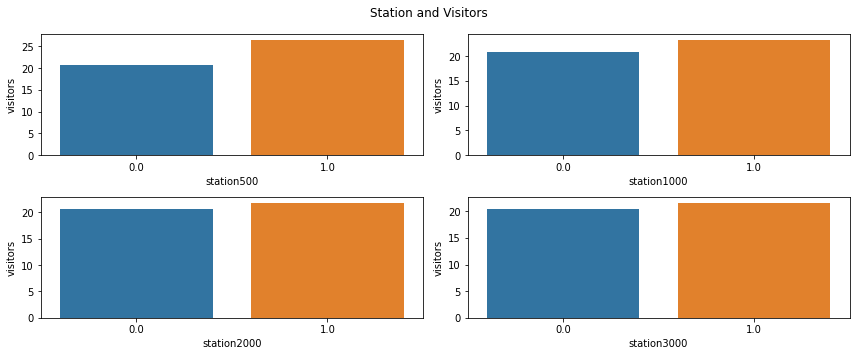

In [159]:
merge = pd.merge(data['air_visit'], data['feature'], on=['air_store_id', 'visit_date'], how='left')

use_col1 = ['visitors', 'station500']
use_col2 = ['visitors', 'station1000']
use_col3 = ['visitors', 'station2000']
use_col4 = ['visitors', 'station3000']

plt.figure(figsize=(12,5))
plt.suptitle('Station and Visitors')

plt.subplot(2,2,1)
df_show1 = merge[use_col1]
df_show1 = df_show1.groupby('station500').mean().reset_index()
sns.barplot(x='station500', y='visitors', data=df_show1)

plt.subplot(2,2,2)
df_show2 = merge[use_col2]
df_show2 = df_show2.groupby('station1000').mean().reset_index()
sns.barplot(x='station1000', y='visitors', data=df_show2)

plt.subplot(2,2,3)
df_show3 = merge[use_col3]
df_show3 = df_show3.groupby('station2000').mean().reset_index()
sns.barplot(x='station2000', y='visitors', data=df_show3)

plt.subplot(2,2,4)
df_show4 = merge[use_col4]
df_show4 = df_show4.groupby('station3000').mean().reset_index()
sns.barplot(x='station3000', y='visitors', data=df_show4)


plt.tight_layout()

### 식당 주위 같은 장르 식당 개수
> **실제 쥬피터노트북 실행 시 보이는 시각화(Folium)**

In [160]:
data['air_store_info'] = gpd.GeoDataFrame(data['air_store_info'],
                                          crs="EPSG:4326",
                                          geometry=gpd.points_from_xy(data['air_store_info'].longitude, 
                                                                      data['air_store_info'].latitude))

data['air_store_info'].head(5)

,air_store_id,air_genre_name,air_area_name,latitude,longitude,is_both,geometry,station500,station1000,station2000,station3000
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,0,POINT (135.19785 34.69512),0,0,1,1
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,1,POINT (135.19785 34.69512),0,0,1,1
2,air_fee8dcf4d619598e,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,0,POINT (135.19785 34.69512),0,0,1,1
3,air_a17f0778617c76e2,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,0,POINT (135.19785 34.69512),0,0,1,1
4,air_83db5aff8f50478e,Italian/French,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,0,POINT (139.75160 35.65807),0,0,0,0


In [161]:
buffer1000 = gpd.GeoDataFrame({'geometry': data['air_store_info'].to_crs(epsg=7855).buffer(1000).to_crs(epsg=4326)})

m2 = folium.Map((33.58922,130.39281), max_zoom=12, zoom_start=12)
folium.GeoJson(buffer1000).add_to(m2)
folium.GeoJson(data['air_store_info']).add_to(m2)
m2

In [162]:
buffer_size = [500,1000,1500,2000]
count_list_per_size = []
for size in buffer_size:
    buffer = gpd.GeoDataFrame({'geometry': data['air_store_info'].to_crs(epsg=7855).buffer(size).to_crs(epsg=4326)})
    count_list = []
    for i in range(len(buffer)):
        intersected = data['air_store_info'][data['air_store_info'].geometry.intersects(buffer.geometry[i])]
        same_genre = intersected.loc[intersected['air_genre_name'] == data['air_store_info'].loc[i, 'air_genre_name']]
        count = len(same_genre)
        count_list.append(count)
    count_list_per_size.append(count_list)

In [163]:
data['air_store_info']['same_genre500'] = np.array(count_list_per_size[0]) - 1
data['air_store_info']['same_genre1000'] = np.array(count_list_per_size[1]) - 1
data['air_store_info']['same_genre1500'] = np.array(count_list_per_size[2]) - 1
data['air_store_info']['same_genre2000'] = np.array(count_list_per_size[3]) - 1
ICD.display(data['air_store_info'].head(3))

col_use = ['air_store_id','same_genre500', 'same_genre1000', 'same_genre1500', 'same_genre2000']
data['feature'] = pd.merge(data['feature'], data['air_store_info'][col_use], on='air_store_id', how='left')
ICD.display(data['feature'].head())
print(data['feature'].shape)  

,air_store_id,air_genre_name,air_area_name,latitude,longitude,is_both,geometry,station500,station1000,station2000,station3000,same_genre500,same_genre1000,same_genre1500,same_genre2000
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,0,POINT (135.19785 34.69512),0,0,1,1,3,3,3,3
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,1,POINT (135.19785 34.69512),0,0,1,1,3,3,3,3
2,air_fee8dcf4d619598e,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197853,0,POINT (135.19785 34.69512),0,0,1,1,3,3,3,3


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,is_both,station500,station1000,station2000,station3000,same_genre500,same_genre1000,same_genre1500,same_genre2000
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,0,1,1,1,1,1,3,3,3,3
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1,1,1,1,1,3,3,3,3
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1,1,1,1,1,3,3,3,3
3,air_00a91d42b08b08d9,2016-01-04,NaN,NaN,3,0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,2,1,1,1,1,1,3,3,3,3
4,air_00a91d42b08b08d9,2016-01-05,NaN,NaN,3,0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,2,1,1,1,1,1,3,3,3,3


(424457, 18)


### 위치와 방문률의 관계

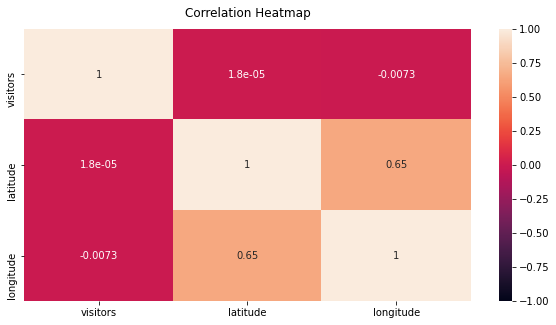

,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,is_both,station500,station1000,station2000,station3000,same_genre500,same_genre1000,same_genre1500,same_genre2000,latitude,longitude
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,0,1,1,1,1,1,3,3,3,3,35.694003,139.753595
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1,1,1,1,1,3,3,3,3,35.694003,139.753595
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1,1,1,1,1,3,3,3,3,35.694003,139.753595


(424457, 20)


In [164]:
use_col1 = ['air_store_id', 'visitors']
use_col2 = ['air_store_id', 'latitude', 'longitude']
df_show = pd.merge(data['air_visit'][use_col1], data['air_store_info'][use_col2], on=['air_store_id'], how='left')

plt.figure(figsize=(10,5))
heatmap = sns.heatmap(df_show.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

use_col = ['air_store_id', 'latitude', 'longitude']
data['feature'] = pd.merge(data['feature'], data['air_store_info'][use_col], on='air_store_id', how='left')

ICD.display(data['feature'].head(3))
print(data['feature'].shape)  

### 식당 위치 그룹화
- 각 식당의 위치를 군집화하여 feature로 사용

,ADM0_EN,ADM0_JA,ADM0_PCODE,ADM1_EN,ADM1_JA,ADM1_PCODE,geometry
0,Japan,日本,JP,Aichi,愛知県,JP23,"MULTIPOLYGON (((137.00719 34.67810, 137.00506 ..."
1,Japan,日本,JP,Akita,秋田県,JP05,"MULTIPOLYGON (((139.87633 39.11970, 139.86987 ..."
2,Japan,日本,JP,Aomori,青森県,JP02,"MULTIPOLYGON (((141.52791 40.54101, 141.52423 ..."
3,Japan,日本,JP,Chiba,千葉県,JP12,"MULTIPOLYGON (((140.11286 35.57128, 140.10691 ..."
4,Japan,日本,JP,Ehime,愛媛県,JP38,"MULTIPOLYGON (((132.55887 32.93409, 132.56388 ..."


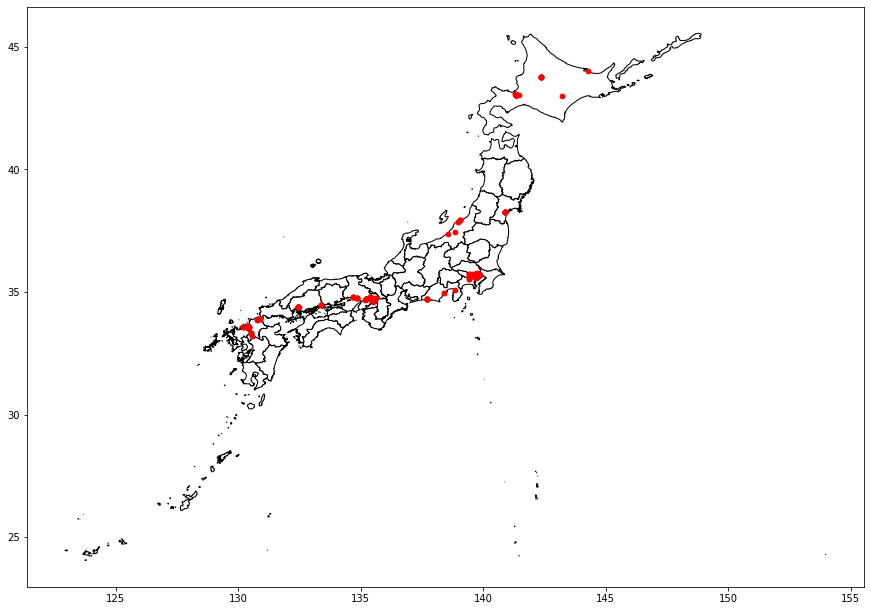

In [165]:
gpd_japan = gpd.read_file('shapefile/jpn_admbnda_adm1_2019.shp')
ICD.display(gpd_japan.head())
data_point = gpd.GeoDataFrame(data['air_store_info'], 
                              geometry=gpd.points_from_xy(data['air_store_info'].longitude, data['air_store_info'].latitude))
base_map = gpd_japan.plot(color='white', edgecolor='black', figsize=(15,15))     # 미국 지도
data_point.plot(ax=base_map, marker='o', color='red', markersize=20, figsize=(5,5))      # 집 위치

plt.show()

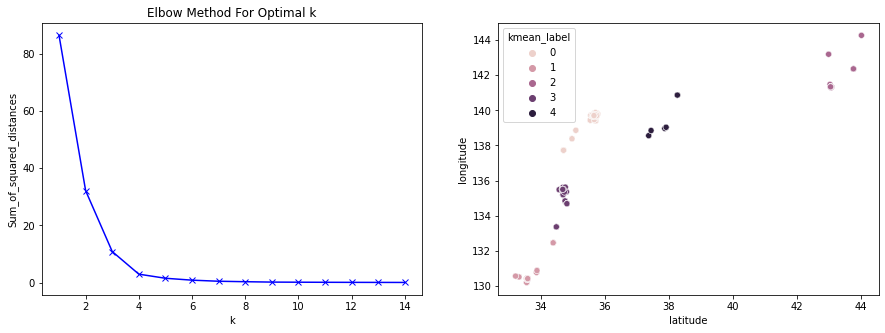

(424457, 21)


,air_store_id,visit_date,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,is_both,...,station1000,station2000,station3000,same_genre500,same_genre1000,same_genre1500,same_genre2000,latitude,longitude,kmean_label
0,air_00a91d42b08b08d9,2016-01-01,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,0,1,...,1,1,1,3,3,3,3,35.694003,139.753595,0
1,air_00a91d42b08b08d9,2016-01-02,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1,...,1,1,1,3,3,3,3,35.694003,139.753595,0
2,air_00a91d42b08b08d9,2016-01-03,NaN,NaN,3,1,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,1,1,...,1,1,1,3,3,3,3,35.694003,139.753595,0


In [166]:
from sklearn.cluster import KMeans

input_x = np.array(data['air_store_info'][['latitude', 'longitude']])

mms = MinMaxScaler()
mms.fit(input_x)
data_transformed = mms.transform(input_x)

Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

km = KMeans(n_clusters=5)
km_label = km.fit(data_transformed).labels_
data['air_store_info']['kmean_label'] = km_label

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')

plt.subplot(1,2,2)
sns.scatterplot(x='latitude', y='longitude', hue='kmean_label', data=data['air_store_info'])
plt.show()

use_col = ['air_store_id', 'kmean_label']
data['feature'] = pd.merge(data['feature'], data['air_store_info'][use_col], on=['air_store_id'], how='left')
print(data['feature'].shape)
data['feature'].head(3)

### 캐글에서 가져온 피쳐
- 직접 추출한 feature로 점수 확인 결과 0.69라는 점수가 나옴
- 상대적으로 좋지 않은 점수로 판단되어 캐글에 있는 좋은 feature를 참고해서 사용

In [167]:
data['feature']['day_of_year'] = data['feature']['visit_date'].dt.dayofyear

first_day = pd.to_datetime('2016-01-01')
data['feature']['days_since_20160101'] = (data['feature'].visit_date - first_day).apply(lambda dt: dt.days)

# Feature Engineering 결과 저장

In [168]:
data['feature'].to_csv('features6.csv', index=False)

# 데이터셋 전처리

### Train셋과 feature 합치기
- 추출한 모든 feature를 Train셋에 대응되는 부분과 merge

In [169]:
train = pd.merge(data['air_visit'], data['feature'], on=['air_store_id', 'visit_date'], how='left')
train_y = np.log1p(train['visitors'].values)
train = train.drop(['air_store_id', 'visit_date', 'visitors'], axis=1)

test = pd.merge(data['sub'], data['feature'], on=['air_store_id', 'visit_date'], how='left')
test = test.drop(['id', 'visitors', 'visit_date', 'air_store_id'], axis=1)

print(train.shape)
ICD.display(train.head(2))
print(test.shape)
ICD.display(test.head(2))

(252108, 24)


,year,month,dow,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,...,station3000,same_genre500,same_genre1000,same_genre1500,same_genre2000,latitude,longitude,kmean_label,day_of_year,days_since_20160101
0,2016,1,2,NaN,NaN,3.0,0.0,Dining bar,Tōkyō-to Minato-ku Shibakōen,2.0,...,0.0,7.0,7.0,7.0,7.0,35.658068,139.751599,0.0,13.0,12.0
1,2016,1,3,NaN,NaN,3.0,0.0,Dining bar,Tōkyō-to Minato-ku Shibakōen,2.0,...,0.0,7.0,7.0,7.0,7.0,35.658068,139.751599,0.0,14.0,13.0


(32019, 24)


,year,month,dow,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,...,station3000,same_genre500,same_genre1000,same_genre1500,same_genre2000,latitude,longitude,kmean_label,day_of_year,days_since_20160101
0,2017,4,6,NaN,NaN,0,0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,2,...,1,3,3,3,3,35.694003,139.753595,0,113,478
1,2017,4,0,NaN,NaN,0,0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,2,...,1,3,3,3,3,35.694003,139.753595,0,114,479


### 결측치 replace 및 label encode
- 결측치는 -1로 대체
- categorical feature의 경우 숫자로 인코딩 실시

In [170]:
from sklearn.preprocessing import LabelEncoder

train = train.fillna(-1)
test = test.fillna(-1)

encoder = LabelEncoder()    
train_len = len(train)

df = pd.concat([train, test])
categorical_features = df.select_dtypes(include='object').columns
for feat in categorical_features:
    df[feat] = encoder.fit_transform(df[feat].astype(str))

train_x = df.iloc[:train_len]
test_x = df.iloc[train_len:]

print(train_x.shape)
ICD.display(train_x.head())
print(test_x.shape)
ICD.display(test_x.head())

(252108, 24)


,year,month,dow,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,...,station3000,same_genre500,same_genre1000,same_genre1500,same_genre2000,latitude,longitude,kmean_label,day_of_year,days_since_20160101
0,2016,1,2,-1.0,-1.0,3.0,0.0,5,63,2.0,...,0.0,7.0,7.0,7.0,7.0,35.658068,139.751599,0.0,13.0,12.0
1,2016,1,3,-1.0,-1.0,3.0,0.0,5,63,2.0,...,0.0,7.0,7.0,7.0,7.0,35.658068,139.751599,0.0,14.0,13.0
2,2016,1,4,-1.0,-1.0,3.0,0.0,5,63,2.0,...,0.0,7.0,7.0,7.0,7.0,35.658068,139.751599,0.0,15.0,14.0
3,2016,1,5,-1.0,-1.0,3.0,0.0,5,63,2.0,...,0.0,7.0,7.0,7.0,7.0,35.658068,139.751599,0.0,16.0,15.0
4,2016,1,0,-1.0,-1.0,3.0,0.0,5,63,2.0,...,0.0,7.0,7.0,7.0,7.0,35.658068,139.751599,0.0,18.0,17.0


(32019, 24)


,year,month,dow,reserve_visitors,reserve_datetime_diff,season,holiday_flg,air_genre_name,air_area_name,3-holiday,...,station3000,same_genre500,same_genre1000,same_genre1500,same_genre2000,latitude,longitude,kmean_label,day_of_year,days_since_20160101
0,2017,4,6,-1.0,-1.0,0.0,0.0,7,45,2.0,...,1.0,3.0,3.0,3.0,3.0,35.694003,139.753595,0.0,113.0,478.0
1,2017,4,0,-1.0,-1.0,0.0,0.0,7,45,2.0,...,1.0,3.0,3.0,3.0,3.0,35.694003,139.753595,0.0,114.0,479.0
2,2017,4,1,-1.0,-1.0,0.0,0.0,7,45,2.0,...,1.0,3.0,3.0,3.0,3.0,35.694003,139.753595,0.0,115.0,480.0
3,2017,4,2,-1.0,-1.0,0.0,0.0,7,45,2.0,...,1.0,3.0,3.0,3.0,3.0,35.694003,139.753595,0.0,116.0,481.0
4,2017,4,3,-1.0,-1.0,0.0,0.0,7,45,2.0,...,1.0,3.0,3.0,3.0,3.0,35.694003,139.753595,0.0,117.0,482.0


### 데이터셋 저장

In [171]:
for title, df in zip(['train_x', 'train_y', 'test_x'], [train_x, pd.DataFrame(train_y), test_x]):
    df.to_csv(f'{title}.csv', index=False)

### 데이터셋 시각화
- 편향된 값인 경도, 위도의 경우 log값을 적용

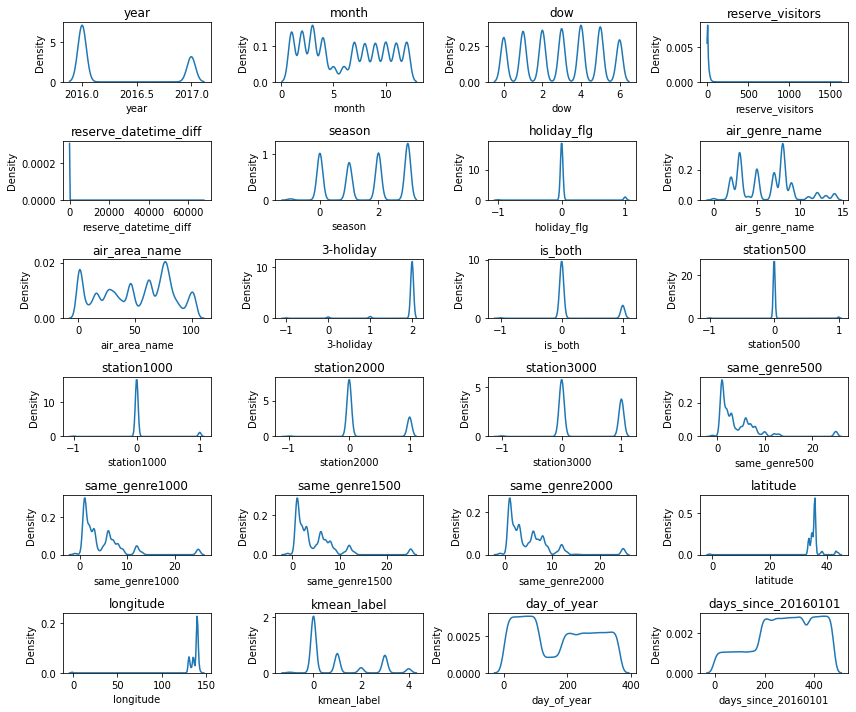

In [172]:
plt.figure(figsize=(12,10))
feature_col = train.columns
for i, feature in enumerate(feature_col):
    plt.subplot(6,4,i+1)
    plt.title(feature)
    sns.kdeplot(train_x[feature])  # 커널밀도함수 출력(히스토그램 업그레이드 버젼)
plt.tight_layout()  

In [173]:
merge = train_x.copy()
merge['visitors'] = train_y

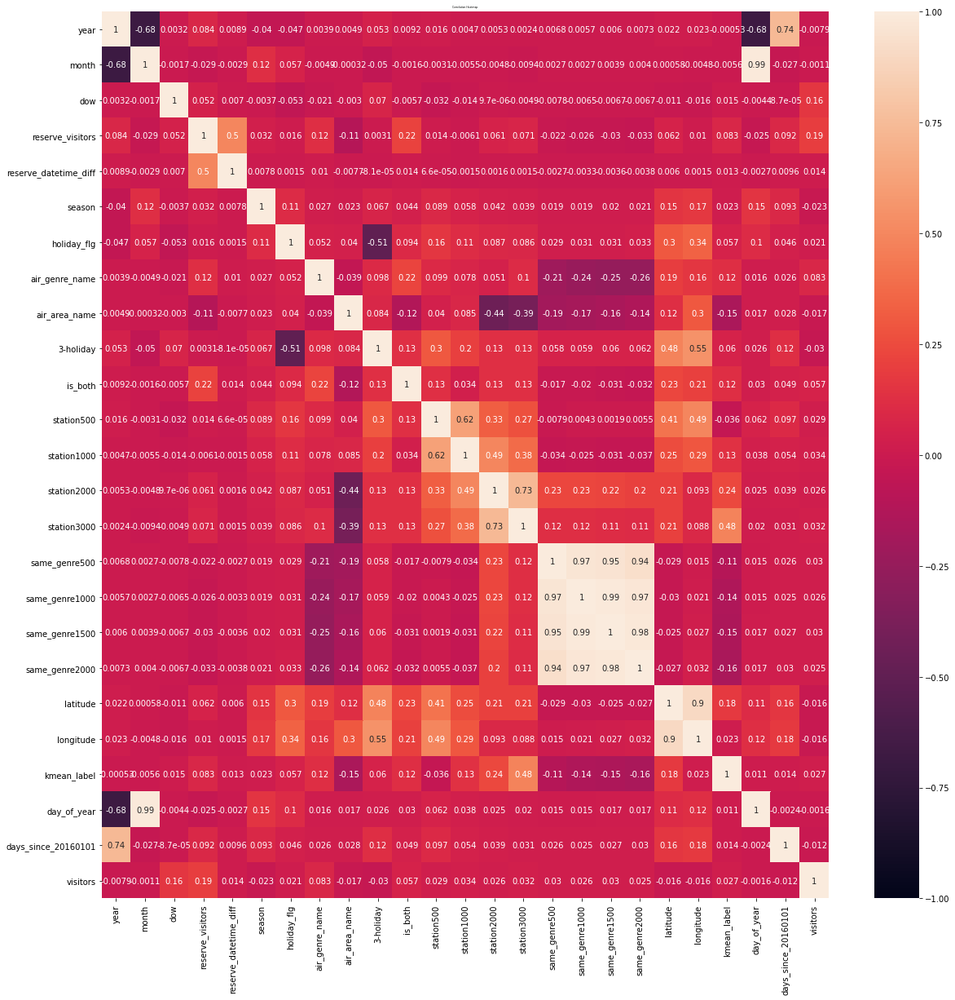

In [174]:
plt.figure(figsize=(20, 20))
heatmap = sns.heatmap(merge.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':3}, pad=5)
plt.show()

# model
- SVM, DecisionTree, RandomForest 등 GridSerach 실시
- XGBoost와 LightBGM 사용
- 가장 성능이 좋은 LightGBM의 결과를 최종 점수로 제출
> **LightGBM의 여러 결과를 이용해 Ensemble 실시**

### Grid Search

In [100]:
cls_dt = DecisionTreeRegressor(random_state=40)   # DecisionTree
# cls_rf = RandomForestRegressor(random_state=40)   # RandomForest
# cls_svm =SVR()                 # SVM
#cls_sgd = SGDRegressor(random_state=40)      # SGDClassifier
#cls_log = LogisticRegression(random_state=40)

In [101]:
tree_param = {'criterion': ['mse','friedman_mse'],'max_depth': list(range(5, 21, 5))}

In [102]:
from sklearn.model_selection import GridSearchCV

model_name = ['Decision Tree']
model_list = [cls_dt]
param_list = [tree_param] # 분류기별 하이퍼파라미터 List
scoring = {'MSLE': 'neg_mean_squared_log_error'} # Recall값을 얻기 위해 인자로 대입

X = train_x.round(0)
y = train_y
scaler = StandardScaler() # 입력값 Scaling 객체 생성
scaler.fit(X) # 입력값(X)의 mean과 std 계산
X_scaled = scaler.transform(X) # 계산된 mean과 std를 실제 입력값(X)에 적용

print('GridSearch Start\n')

d = {}
results = {}
for name, model, param in zip(model_name, model_list, param_list):
    print(name)
    grid_search = GridSearchCV(model, param, cv=5, refit='MSLE', scoring=scoring) # Recall값을 기준으로 가장 좋은 모델 반환
    result = grid_search.fit(X_scaled, y) # GridSearch 실행
    results[name] = result.cv_results_ # 분류기별 결과 모음
    
    d[name] = {
        'best_param': result.best_params_, # 각 분류기별 Recall을 기준으로 결과가 가장 좋게 나오게 한 하이퍼파라미터
        'best_score': result.best_score_   # 결과가 가장 좋은 모델의 Recall값
    }
    
    print(f'{name} Finished')
    
print('\nGridSearch Finished')

GridSearch Start

Decision Tree
Decision Tree Finished

GridSearch Finished


### XGBoost

In [729]:
import xgboost as xgb
import warnings

pd.options.mode.chained_assignment = None
xgb_params = {
    'eta': 0.01,
    'max_depth': 6,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse'}

print('Transform DMatrix...')
dtrain = xgb.DMatrix(train_x, train_y)  # xgboost가 학습할 수 있는 형태의 dataset으로 변경

print('Start Cross Validation...')

# Cross Validation 실시
cv_output = xgb.cv(xgb_params, dtrain, num_boost_round=5000, early_stopping_rounds=20, verbose_eval=50)

Transform DMatrix...
Start Cross Validation...


Best num_boost_rounds =  5000
Best Score of RMSE =  0.6686196666666667


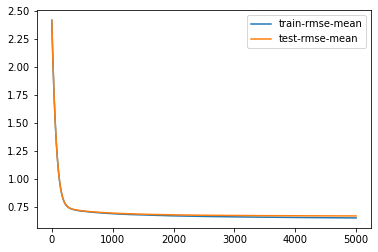

In [730]:
cv_output[['train-rmse-mean', 'test-rmse-mean']].plot()
rounds = len(cv_output)
print('Best num_boost_rounds = ', len(cv_output))
print('Best Score of RMSE = ', cv_output.loc[rounds-1, 'test-rmse-mean'])
model_results['XGBoost'] = cv_output.loc[rounds-1, 'test-rmse-mean']

### LightBGM

In [204]:
# LgihtGBM 하이퍼 파라미터
param = {'num_leaves': 31,
         'min_data_in_leaf': 30, 
         'objective':'regression',
         'max_depth': -1,
         'learning_rate': 0.015,
         "min_child_samples": 20,
         "boosting": "gbdt",
         "feature_fraction": 0.9,
         "bagging_freq": 1,
         "bagging_fraction": 0.9 ,
         "bagging_seed": 11,
         "metric": 'rmse',
         "lambda_l1": 0.1,
         "verbosity": -1,
         "nthread": 4,
         "random_state": 4950}

train_columns = list(train_x.columns)
y_reg = pd.Series(train_y)

#prepare fit model with cross-validation
folds = KFold(n_splits=5, shuffle=True, random_state=42)    # KFold Cross Validation 함수
oof = np.zeros(len(train_x))
#predictions = np.zeros(len(df_test))
feature_importance_df = pd.DataFrame()                       # 이후에 feature의 중요도를 시각화하기 위한 준비단계

#run model
for fold_, (trn_idx, val_idx) in enumerate(folds.split(train_x)):
    trn_data = lgb.Dataset(train_x.iloc[trn_idx][train_columns], label=y_reg.iloc[trn_idx]) # LightGBM이 학습할 수 있는 형식으로 변환
    val_data = lgb.Dataset(train_x.iloc[val_idx][train_columns], label=y_reg.iloc[val_idx]) # LightGBM이 학습할 수 있는 형식으로 변환

    num_round = 10000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=500, early_stopping_rounds = 100)
    oof[val_idx] = clf.predict(train_x.iloc[val_idx][train_columns], num_iteration=clf.best_iteration)
    #feature importance
    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = train_columns
    fold_importance_df["importance"] = clf.feature_importance()
    fold_importance_df["fold"] = fold_ + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    
cv = np.sqrt(mean_squared_error(oof, y_reg))
print('The RMSE of LightBGM = ', cv)
model_results['LightBGM'] = cv

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
Training until validation scores don't improve for 100 rounds
[500]	training's rmse: 0.694882	valid_1's rmse: 0.697769
[1000]	training's rmse: 0.679145	valid_1's rmse: 0.682888
[1500]	training's rmse: 0.670831	valid_1's rmse: 0.675903
[2000]	training's rmse: 0.665399	valid_1's rmse: 0.671911
[2500]	training's rmse: 0.661406	valid_1's rmse: 0.669403
[3000]	training's rmse: 0.658175	valid_1's rmse: 0.667558
[3500]	training's rmse: 0.655577	valid_1's rmse: 0.66627
[4000]	training's rmse: 0.653296	valid_1's rmse: 0.665264
[4500]	training's rmse: 0.651357	valid_1's rmse: 0.664642
[5000]	training's rmse: 0.649645	valid_1's rmse: 0.664121
[5500]	training's rmse: 0.648072	valid_1's rmse: 0.663751
[6000]	training's rmse: 0.646644	valid_1's rmse: 0.66345
[6500]	training's rmse: 0.645341	valid_1's rmse: 0.663254
[7000]	training's rmse: 0.644119	valid_1's rmse: 0.663116
Early s

### Feature Importance

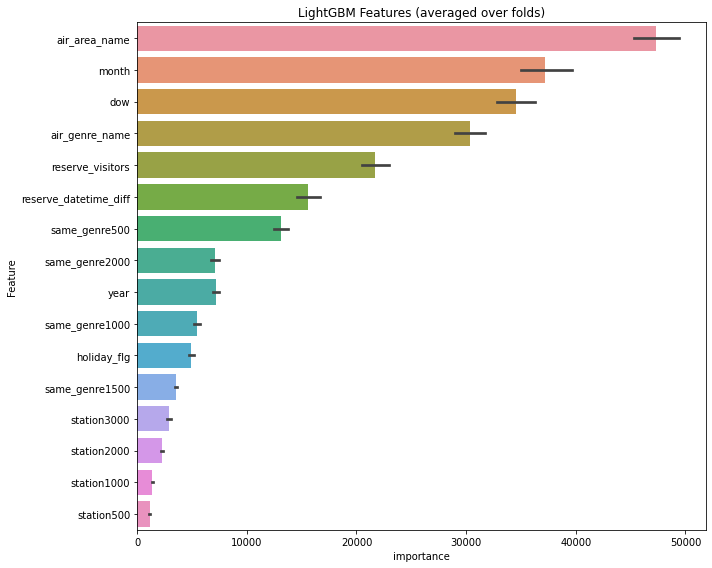

In [206]:
cols = (feature_importance_df[["Feature", "importance"]]
        .groupby("Feature")
        .mean()
        .sort_values(by="importance", ascending=False)[:1000].index)
best_features = feature_importance_df.loc[feature_importance_df.Feature.isin(cols)]

plt.figure(figsize=(10, 8))
sns.barplot(x="importance", y="Feature", data=best_features.sort_values(by="importance",ascending=False))
plt.title('LightGBM Features (averaged over folds)')
plt.tight_layout()

# Submission

In [207]:
submission = pd.DataFrame({
    'id': data['sub']['id'],
    'visitors': np.expm1(clf.predict(test_x))
})

submission.to_csv('submission/try5.csv', index=False)

### Ensemble

In [325]:
try1 = pd.read_csv('submission/try1.csv')
try2 = pd.read_csv('submission/try2.csv')
try3 = pd.read_csv('submission/try3.csv')
try4 = pd.read_csv('submission/try4.csv')

final = try1['visitors']*0.3 + try2['visitors']*0.3 + try3['visitors']*0.3 + try4['visitors']*0.1

submission = pd.DataFrame({
    'id': data['sub']['id'],
    'visitors': final})

submission.to_csv('submission/ensemble3.csv', index=False)

# 결과

![Submission](HACKATHON1_submission3.JPG)

# 참고자료
- https://www.kaggle.com/maestroyi/restaurant-visitor-forecasting-eda-with-r
- https://creedmaestro.github.io/kaggle/2019/04/25/Kaggle_Restaurant_Visitor_Forecasting(Introduction,EDA).html
- 외부 데이터인 벚꽃 데이터와 기상청 데이터 활용을 시도했지만 데이터 처리문제로 실패
- 성능에 좋은 영향을 미치는 feature를 추출하려고 노력했지만 실패
- 다양한 feature extraction 결과 좋은 결과가 나와서 뿌듯함
> **처음 데이터를 접했을 때 데이터에 대한 정보를 얻고 피쳐에는 어떤 것들이 있는지 확인하기 위해 참조했습니다.**